# Random Noise Attenuation using Wavelet denosing 

Ref : [Scikit-image Tutorial on wavelet denoising](https://scikit-image.org/docs/dev/auto_examples/filters/plot_denoise_wavelet.html#sphx-glr-auto-examples-filters-plot-denoise-wavelet-py)

## Summary 
- Given a segy file, it added random noise.
- Plots samples of clean, noisy and difference for comparison 
- Estimates noise using `skimage` library's estimate_sigma 
- Attenuates noise using Bayesian and VisualShrink algorithms for wavelet denoising
- Runs noise sensitivity analysis for for sigma in [0.1,1]


In [88]:
import sys 
sys.path.append('../utils')

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 

from obspy.io.segy.core import _read_segy

from skimage.restoration import denoise_wavelet , estimate_sigma
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

from torchmetrics.image import ssim

from hopkins_statistic import hopkin_iter

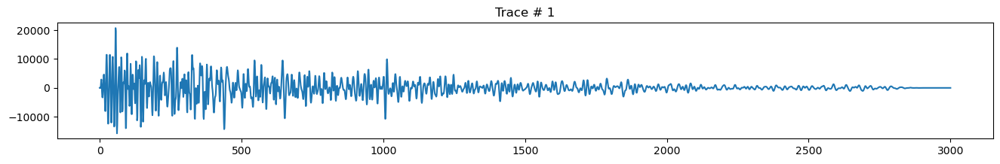

In [89]:
# segy file 
filename = '/geofs/home/hwjayb/denoising_research/evaluation_of_seismic_denoising/data/MP36-08_PSTM_STK.sgy'
stream = _read_segy(filename)
# first trace
one_trace = stream.traces[0]

plt.figure(figsize=(16,2))
plt.plot(one_trace.data)
plt.title("Trace # 1")
plt.show()

In [90]:
# Reading the data into numpy array 

data = np.stack(t.data for t in stream.traces)

# clipping to 99th percentile
vm = np.percentile(np.abs(data), 99)
print("The 99th percentile is {:.0f}; the max amplitude is {:.0f}".format(vm, data.max()))

data = np.clip(data, -vm, vm)

/geofs/home/hwjayb/anaconda3/envs/lightning/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3318: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if await self.run_code(code, result, async_=asy):


The 99th percentile is 31648; the max amplitude is 99803


In [91]:
data.T.shape

(3001, 2649)

In [92]:
data.min(), data.max()

(-31647.855, 31647.855)

In [93]:
# normalising the data from 0 to 1 
global_min = data.min()
global_max = data.max() 

data = (data - global_min)/(global_max - global_min)

In [94]:
randtraces = np.random.randint(0,data.shape[1] - 200 , 4)
randtimes = np.random.randint(0,1000, 4)
randtraces, randtimes

(array([1403, 1898, 1721,  611]), array([550, 570, 390,  41]))

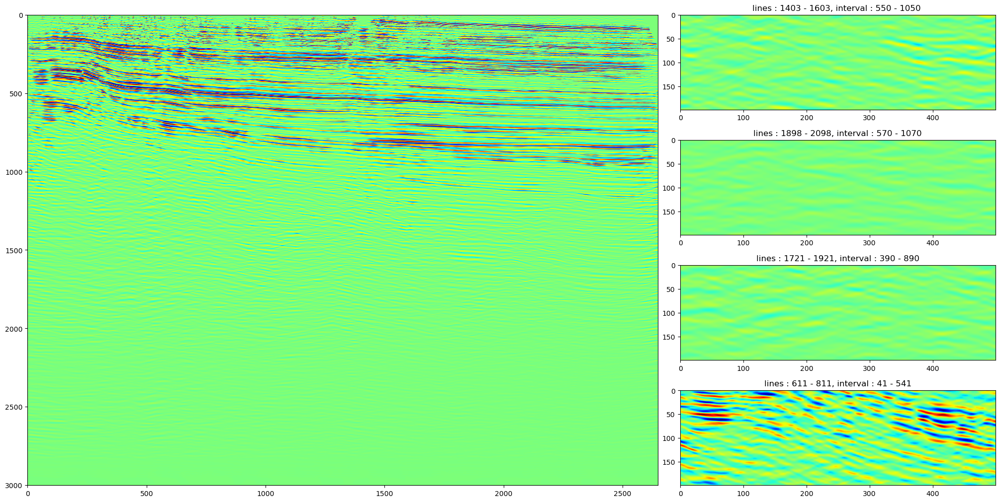

In [95]:
# plot segy

mosaic='''
AAAABB
AAAACC
AAAADD
AAAAEE
'''

fig,axes = plt.subplot_mosaic(mosaic, constrained_layout=True, figsize=(20,10))
axes['A'].imshow(data.T, cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')

axes['B'].imshow(data.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['B'].set_title(f"lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['C'].imshow(data.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['C'].set_title(f"lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['D'].imshow(data.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['D'].set_title(f"lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['E'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['E'].set_title(f"lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

plt.show()

In [96]:
# add noise 
sigma = .12
noisy = random_noise(data, var = sigma**2, clip=True)

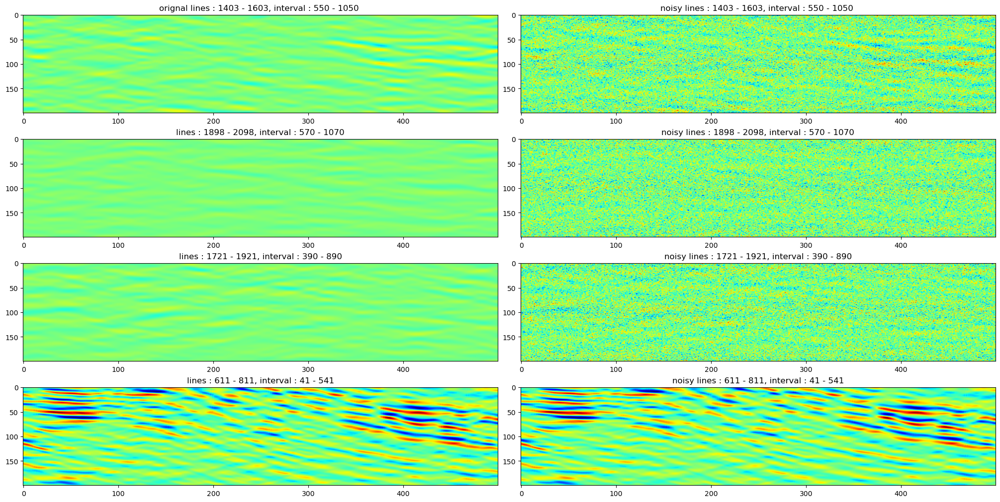

In [97]:
# plot noisy segy

mosaic='''
AABB
CCDD
EEFF
GGHH
'''

fig,axes = plt.subplot_mosaic(mosaic, constrained_layout=True, figsize=(20,10))


axes['A'].imshow(data.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['A'].set_title(f"orignal lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['B'].imshow(noisy.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['B'].set_title(f"noisy lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")


axes['C'].imshow(data.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['C'].set_title(f"lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['D'].imshow(noisy.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['D'].set_title(f"noisy lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['E'].imshow(data.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['E'].set_title(f"lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['F'].imshow(noisy.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['F'].set_title(f"noisy lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")


axes['G'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['G'].set_title(f"lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")


axes['H'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['H'].set_title(f"noisy lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

plt.show()

In [98]:
# noise estimate -- using skimage
sigma_est = estimate_sigma(noisy, channel_axis=None, average_sigmas=True)
round(sigma_est,2)

0.12

In [99]:
im_bayes = denoise_wavelet(noisy, channel_axis=None,
                           method='BayesShrink', mode='soft',
                           rescale_sigma=True)
im_visushrink = denoise_wavelet(noisy, channel_axis=None,
                                method='VisuShrink', mode='soft',
                                sigma=sigma_est, rescale_sigma=True)

im_visushrink2 = denoise_wavelet(noisy, channel_axis=None,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/2, rescale_sigma=True)
im_visushrink4 = denoise_wavelet(noisy, channel_axis=None,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/4, rescale_sigma=True)

In [100]:
bayes_diff = noisy - im_bayes
visushrink_diff = noisy - im_visushrink
visushrink_diff_2 = noisy - im_visushrink2
visushrink_diff_4 = noisy - im_visushrink4

In [101]:
# Compute PSNR as an indication of image quality
original = data 

psnr_noisy = peak_signal_noise_ratio(original, noisy)
psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)

display(psnr_noisy, psnr_bayes,psnr_visushrink, psnr_visushrink2, psnr_visushrink4)

/tmp/ipykernel_26405/551804188.py:4: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/551804188.py:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/551804188.py:6: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/551804188.py:7: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/551804188.py:8: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)


18.479741832659784

27.401286106628405

22.348429376698547

24.83047275452986

25.972104580412875

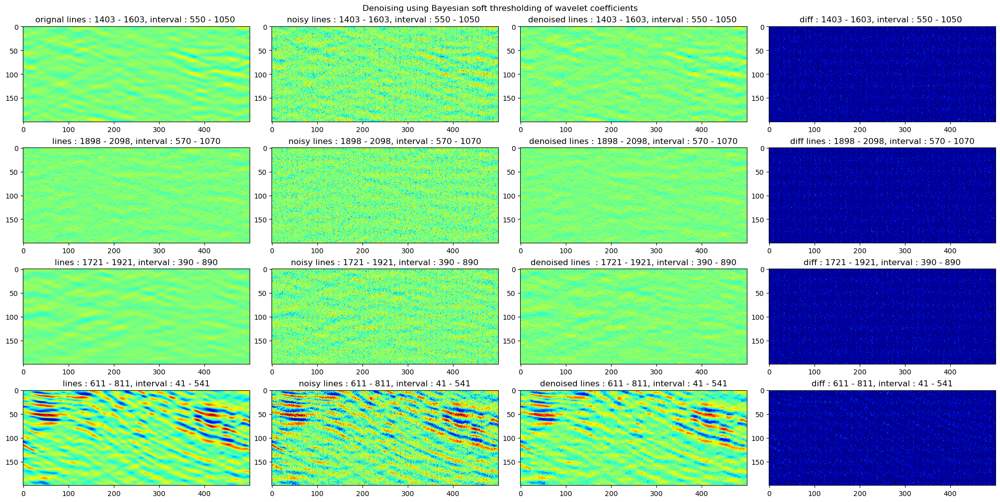

In [102]:
# comparison of denoising : bayes 

# plot noisy segy

mosaic='''
AABBIIJJ
CCDDKKLL
EEFFMMNN
GGHHOOPP
'''

fig,axes = plt.subplot_mosaic(mosaic, constrained_layout=True, figsize=(20,10))

fig.suptitle("Denoising using Bayesian soft thresholding of wavelet coefficients")


axes['A'].imshow(data.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['A'].set_title(f"orignal lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['B'].imshow(noisy.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['B'].set_title(f"noisy lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['I'].imshow(im_bayes.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['I'].set_title(f"denoised lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['J'].imshow(bayes_diff.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['J'].set_title(f"diff : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")




axes['C'].imshow(im_bayes.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['C'].set_title(f"lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['D'].imshow(noisy.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['D'].set_title(f"noisy lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['K'].imshow(im_bayes.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['K'].set_title(f"denoised lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['L'].imshow(bayes_diff.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['L'].set_title(f"diff lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")








axes['E'].imshow(data.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['E'].set_title(f"lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['F'].imshow(noisy.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['F'].set_title(f"noisy lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['M'].imshow(im_bayes.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['M'].set_title(f"denoised lines  : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['N'].imshow(bayes_diff.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['N'].set_title(f"diff : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")




axes['G'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['G'].set_title(f"lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")


axes['H'].imshow(noisy.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['H'].set_title(f"noisy lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['O'].imshow(im_bayes.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['O'].set_title(f"denoised lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['P'].imshow(bayes_diff.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['P'].set_title(f"diff : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

plt.show()

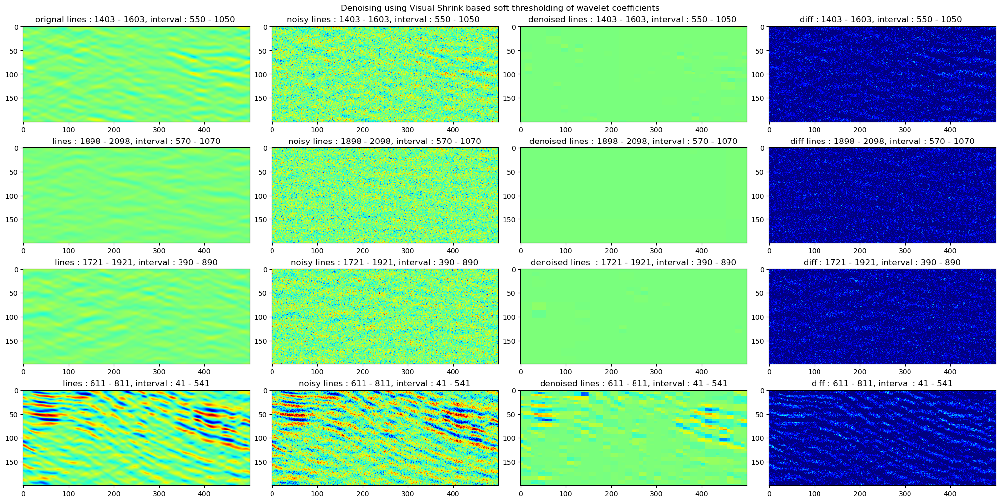

In [103]:
# comparison of denoising : visual shrink algorithm 

# plot noisy segy

mosaic='''
AABBIIJJ
CCDDKKLL
EEFFMMNN
GGHHOOPP
'''

fig,axes = plt.subplot_mosaic(mosaic, constrained_layout=True, figsize=(20,10))

fig.suptitle("Denoising using Visual Shrink based soft thresholding of wavelet coefficients")


axes['A'].imshow(data.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['A'].set_title(f"orignal lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['B'].imshow(noisy.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['B'].set_title(f"noisy lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['I'].imshow(im_visushrink.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['I'].set_title(f"denoised lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['J'].imshow(visushrink_diff.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['J'].set_title(f"diff : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")




axes['C'].imshow(data.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['C'].set_title(f"lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['D'].imshow(noisy.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['D'].set_title(f"noisy lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['K'].imshow(im_visushrink.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['K'].set_title(f"denoised lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['L'].imshow(visushrink_diff.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['L'].set_title(f"diff lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")








axes['E'].imshow(data.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['E'].set_title(f"lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['F'].imshow(noisy.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['F'].set_title(f"noisy lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['M'].imshow(im_visushrink.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['M'].set_title(f"denoised lines  : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['N'].imshow(visushrink_diff.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['N'].set_title(f"diff : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")




axes['G'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['G'].set_title(f"lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")


axes['H'].imshow(noisy.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['H'].set_title(f"noisy lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['O'].imshow(im_visushrink.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['O'].set_title(f"denoised lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['P'].imshow(visushrink_diff.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['P'].set_title(f"diff : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

plt.show()

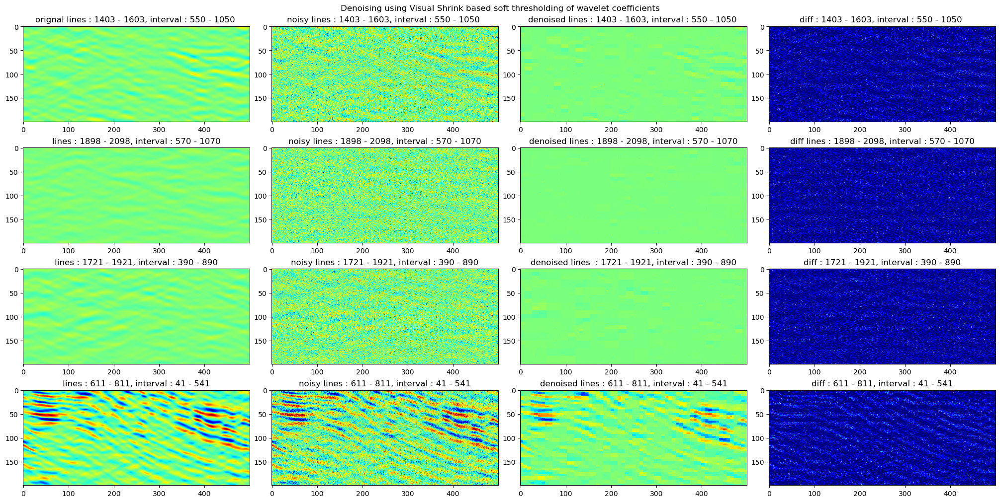

In [104]:
# comparison of denoising : visual shrink algorithm 

# plot noisy segy

mosaic='''
AABBIIJJ
CCDDKKLL
EEFFMMNN
GGHHOOPP
'''

fig,axes = plt.subplot_mosaic(mosaic, constrained_layout=True, figsize=(20,10))

fig.suptitle("Denoising using Visual Shrink based soft thresholding of wavelet coefficients")


axes['A'].imshow(data.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['A'].set_title(f"orignal lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['B'].imshow(noisy.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['B'].set_title(f"noisy lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['I'].imshow(im_visushrink2.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['I'].set_title(f"denoised lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['J'].imshow(visushrink_diff_2.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['J'].set_title(f"diff : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")




axes['C'].imshow(data.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['C'].set_title(f"lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['D'].imshow(noisy.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['D'].set_title(f"noisy lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['K'].imshow(im_visushrink2.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['K'].set_title(f"denoised lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['L'].imshow(visushrink_diff_2.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['L'].set_title(f"diff lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")








axes['E'].imshow(data.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['E'].set_title(f"lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['F'].imshow(noisy.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['F'].set_title(f"noisy lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['M'].imshow(im_visushrink2.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['M'].set_title(f"denoised lines  : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['N'].imshow(visushrink_diff_2.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['N'].set_title(f"diff : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")




axes['G'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['G'].set_title(f"lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")


axes['H'].imshow(noisy.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['H'].set_title(f"noisy lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['O'].imshow(im_visushrink2.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['O'].set_title(f"denoised lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['P'].imshow(visushrink_diff_2.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['P'].set_title(f"diff : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

plt.show()

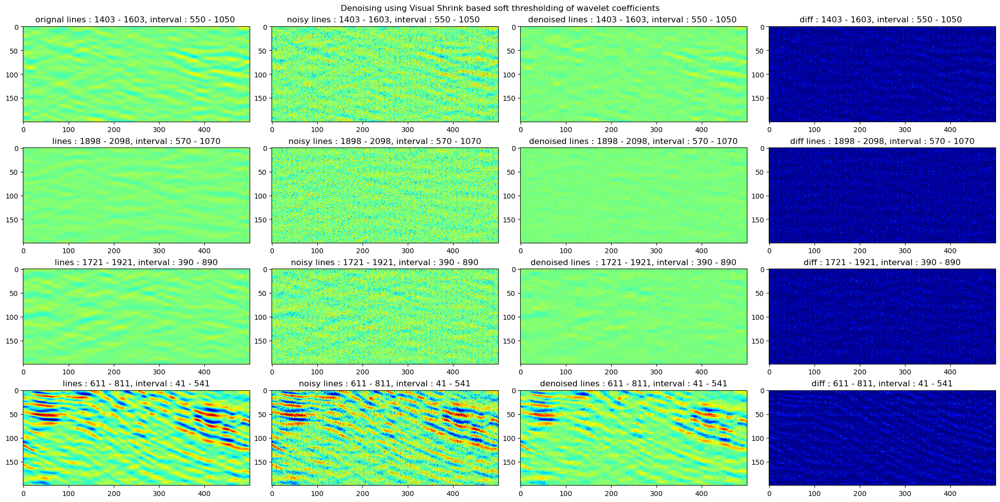

In [105]:
# comparison of denoising : visual shrink algorithm 

# plot noisy segy

mosaic='''
AABBIIJJ
CCDDKKLL
EEFFMMNN
GGHHOOPP
'''

fig,axes = plt.subplot_mosaic(mosaic, constrained_layout=True, figsize=(20,10))

fig.suptitle("Denoising using Visual Shrink based soft thresholding of wavelet coefficients")


axes['A'].imshow(data.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['A'].set_title(f"orignal lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['B'].imshow(noisy.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['B'].set_title(f"noisy lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['I'].imshow(im_visushrink4.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['I'].set_title(f"denoised lines : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")

axes['J'].imshow(visushrink_diff_4.T[randtraces[0] :randtraces[0] + 200, randtimes[0] : randtimes[0] + 500],cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['J'].set_title(f"diff : {randtraces[0]} - {randtraces[0] + 200}, interval : {randtimes[0]} - {randtimes[0] + 500} ")




axes['C'].imshow(data.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['C'].set_title(f"lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['D'].imshow(noisy.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['D'].set_title(f"noisy lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['K'].imshow(im_visushrink4.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['K'].set_title(f"denoised lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")

axes['L'].imshow(visushrink_diff_4.T[randtraces[1] :randtraces[1] + 200, randtimes[1] : randtimes[1] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['L'].set_title(f"diff lines : {randtraces[1]} - {randtraces[1] + 200}, interval : {randtimes[1]} - {randtimes[1] + 500}")








axes['E'].imshow(data.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['E'].set_title(f"lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['F'].imshow(noisy.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['F'].set_title(f"noisy lines : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['M'].imshow(im_visushrink4.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['M'].set_title(f"denoised lines  : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")

axes['N'].imshow(visushrink_diff_4.T[randtraces[2]:randtraces[2] + 200, randtimes[2] : randtimes[2] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['N'].set_title(f"diff : {randtraces[2]} - {randtraces[2] + 200}, interval : {randtimes[2]} - {randtimes[2] + 500}")




axes['G'].imshow(data.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['G'].set_title(f"lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")


axes['H'].imshow(noisy.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['H'].set_title(f"noisy lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['O'].imshow(im_visushrink4.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['O'].set_title(f"denoised lines : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

axes['P'].imshow(visushrink_diff_4.T[randtraces[3]:randtraces[3] + 200, randtimes[3] : randtimes[3] + 500], cmap=plt.cm.jet, vmin=0,vmax=1, aspect='auto')
axes['P'].set_title(f"diff : {randtraces[3]} - {randtraces[3] + 200}, interval : {randtimes[3]} - {randtimes[3] + 500}")

plt.show()

As visible from the above panels, although the algorithm is estimating the noise level accurately, the denoised image has signal leakage. 

In [106]:
# calculating hopkin's statistic for the removed noise to understand its clustering tendency 
bayes_h = hopkin_iter(bayes_diff,10 )
visushrink_h = hopkin_iter(visushrink_diff,10 )
visushrink2_h = hopkin_iter(visushrink_diff_2,10 )
visushrink4_h = hopkin_iter(visushrink_diff_4,10 )

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

In [107]:
print("Hopkin statistic shows the tendency to cluster, Ref : Uniform Distribution's clustering tendency = 0.5")
print('hopkin statistic for bayesian wavelet denoising : (mean, std)', bayes_h)
print('hopkin statistic for visual shrinking based wavelet denoising at estimated noise power : (mean, std)', visushrink_h)
print('hopkin statistic for visual shrinking based wavelet denoising at estimated noise power/2 : (mean, std)', visushrink2_h)
print('hopkin statistic for visual shrinking based wavelet denoising at estimated noise power/4 : (mean, std)', visushrink4_h)

Hopkin statistic shows the tendency to cluster, Ref : Uniform Distribution's clustering tendency = 0.5
hopkin statistic for bayesian wavelet denoising : (mean, std) (0.643, 0.0)
hopkin statistic for visual shrinking based wavelet denoising at estimated noise power : (mean, std) (0.635, 0.0)
hopkin statistic for visual shrinking based wavelet denoising at estimated noise power/2 : (mean, std) (0.623, 0.0)
hopkin statistic for visual shrinking based wavelet denoising at estimated noise power/4 : (mean, std) (0.621, 0.0)


In [108]:
# calculating noise sensitivity 
sigma_range = np.linspace(0.1, 1, 20)

noise_sensitivity_df = pd.DataFrame(columns = [
    'sigma','sigma_estimated',
    'psnr_noisy','psnr_bayes','psnr_visushrink','psnr_visushrink2','psnr_visushrink4',
    'ssim_noisy','ssim_bayes','ssim_visushrink','ssim_visushrink2','ssim_visushrink4',
    'bayes_h','visushrink_h','visushrink2_h','visushrink4_h'
])
for sigma in sigma_range : 
    noisy = random_noise(data, var = sigma**2, clip=True)
    # noise estimate -- using skimage
    sigma_est = estimate_sigma(noisy, channel_axis=None, average_sigmas=True)
    sigma_est = round(sigma_est,2)
    
    im_bayes = denoise_wavelet(noisy, channel_axis=None,
                           method='BayesShrink', mode='soft',
                           rescale_sigma=True)
    im_visushrink = denoise_wavelet(noisy, channel_axis=None,
                                method='VisuShrink', mode='soft',
                                sigma=sigma_est, rescale_sigma=True)

    im_visushrink2 = denoise_wavelet(noisy, channel_axis=None,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/2, rescale_sigma=True)
    im_visushrink4 = denoise_wavelet(noisy, channel_axis=None,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/4, rescale_sigma=True)
    
    bayes_diff = noisy - im_bayes
    visushrink_diff = noisy - im_visushrink
    visushrink_diff_2 = noisy - im_visushrink2
    visushrink_diff_4 = noisy - im_visushrink4

    # Compute PSNR as an indication of image quality
    original = data 

    psnr_noisy = peak_signal_noise_ratio(original, noisy)
    psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
    psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
    psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
    psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)
    
    ssim=structural_similarity

    ssim_noisy = ssim(original, noisy)
    ssim_bayes = ssim(original, im_bayes)
    ssim_visushrink = ssim(original, im_visushrink)
    ssim_visushrink2 = ssim(original, im_visushrink2)
    ssim_visushrink4 = ssim(original, im_visushrink4)
    
    bayes_h = hopkin_iter(bayes_diff,10 )
    visushrink_h = hopkin_iter(visushrink_diff,10 )
    visushrink2_h = hopkin_iter(visushrink_diff_2,10 )
    visushrink4_h = hopkin_iter(visushrink_diff_4,10 )
    
    print([
        sigma,sigma_est,
    psnr_noisy,psnr_bayes,psnr_visushrink,psnr_visushrink2,psnr_visushrink4,
    ssim_noisy,ssim_bayes,ssim_visushrink,ssim_visushrink2,ssim_visushrink4,
    bayes_h,visushrink_h,visushrink2_h,visushrink4_h
    ])
    
    noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
    'sigma','sigma_estimated',
    'psnr_noisy','psnr_bayes','psnr_visushrink','psnr_visushrink2','psnr_visushrink4',
    'ssim_noisy','ssim_bayes','ssim_visushrink','ssim_visushrink2','ssim_visushrink4',
    'bayes_h','visushrink_h','visushrink2_h','visushrink4_h'
],[
        sigma,sigma_est,
    psnr_noisy,psnr_bayes,psnr_visushrink,psnr_visushrink2,psnr_visushrink4,
    ssim_noisy,ssim_bayes,ssim_visushrink,ssim_visushrink2,ssim_visushrink4,
    bayes_h,visushrink_h,visushrink2_h,visushrink4_h
    ])), ignore_index=True)

/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/317111599.py:42: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)
/geofs/home/hwjayb/anaconda3/envs/lightning/lib/python3.9/site-p

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([
/tmp/ipykernel_26405/317111599.py:38: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_noisy = peak_signal_noise_ratio(original, noisy)
/tmp/ipykernel_26405/317111599.py:39: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
/tmp/ipykernel_26405/317111599.py:40: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
/tmp/ipykernel_26405/317111599.py:41: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
/tmp/ipykernel_26405/3

Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic : Iteration 3
Calculating Hopkins Statistic : Iteration 4
Calculating Hopkins Statistic : Iteration 5
Calculating Hopkins Statistic : Iteration 6
Calculating Hopkins Statistic : Iteration 7
Calculating Hopkins Statistic : Iteration 8
Calculating Hopkins Statistic : Iteration 9
Calculating Hopkins Statistic : Iteration 10
Calculating Hopkins Statistic : Iteration 1
Calculating Hopkins Statistic : Iteration 2
Calculating Hopkins Statistic 

/tmp/ipykernel_26405/317111599.py:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noise_sensitivity_df = noise_sensitivity_df.append(dict(zip([


In [109]:
noise_sensitivity_df

,sigma,sigma_estimated,psnr_noisy,psnr_bayes,psnr_visushrink,psnr_visushrink2,psnr_visushrink4,ssim_noisy,ssim_bayes,ssim_visushrink,ssim_visushrink2,ssim_visushrink4,bayes_h,visushrink_h,visushrink2_h,visushrink4_h
0,0.100000,0.10,20.048706,28.312723,22.962715,25.565250,27.070144,0.422744,0.884947,0.837733,0.893218,0.848188,"(0.648, 0.0)","(0.645, 0.0)","(0.628, 0.0)","(0.622, 0.0)"
1,0.147368,0.15,16.721794,26.444130,21.556918,23.862705,24.830778,0.286646,0.852190,0.802769,0.860236,0.759870,"(0.631, 0.0)","(0.617, 0.0)","(0.61, 0.001)","(0.617, 0.0)"
2,0.194737,0.19,14.413844,25.231090,20.774047,22.837903,23.088508,0.211412,0.828051,0.782082,0.836170,0.657271,"(0.602, 0.0)","(0.574, 0.0)","(0.574, 0.0)","(0.603, 0.0)"
3,0.242105,0.23,12.766870,24.307340,20.196799,22.006820,21.878567,0.166368,0.813867,0.766343,0.815332,0.583821,"(0.582, 0.0)","(0.543, 0.0)","(0.548, 0.0)","(0.584, 0.0)"
4,0.289474,0.27,11.572566,23.481937,19.764213,21.312320,21.087223,0.136782,0.804583,0.754629,0.797969,0.542240,"(0.557, 0.0)","(0.521, 0.0)","(0.528, 0.001)","(0.565, 0.0)"
5,0.336842,0.30,10.693009,22.790365,19.506384,20.841200,20.436896,0.116244,0.799220,0.747902,0.785475,0.502626,"(0.543, 0.0)","(0.506, 0.0)","(0.514, 0.0)","(0.556, 0.0)"
6,0.384211,0.32,10.030445,22.198008,19.355327,20.506398,19.844761,0.101230,0.791301,0.744056,0.775888,0.461935,"(0.529, 0.0)","(0.496, 0.0)","(0.505, 0.0)","(0.549, 0.0)"
7,0.431579,0.35,9.511196,21.734558,19.211842,20.157164,19.601165,0.089722,0.785165,0.740616,0.766876,0.457623,"(0.519, 0.0)","(0.488, 0.0)","(0.497, 0.0)","(0.544, 0.0)"
8,0.478947,0.37,9.096442,21.359689,19.145991,19.920715,19.301928,0.080501,0.779988,0.739113,0.759896,0.441707,"(0.507, 0.001)","(0.482, 0.0)","(0.49, 0.0)","(0.539, 0.0)"
9,0.526316,0.38,8.763639,21.040204,19.099908,19.757387,18.955246,0.073262,0.775708,0.738055,0.755100,0.416082,"(0.5, 0.0)","(0.477, 0.0)","(0.485, 0.0)","(0.536, 0.0)"


In [110]:
noise_sensitivity_df[~noise_sensitivity_df.isnull()]

,sigma,sigma_estimated,psnr_noisy,psnr_bayes,psnr_visushrink,psnr_visushrink2,psnr_visushrink4,ssim_noisy,ssim_bayes,ssim_visushrink,ssim_visushrink2,ssim_visushrink4,bayes_h,visushrink_h,visushrink2_h,visushrink4_h
0,0.100000,0.10,20.048706,28.312723,22.962715,25.565250,27.070144,0.422744,0.884947,0.837733,0.893218,0.848188,"(0.648, 0.0)","(0.645, 0.0)","(0.628, 0.0)","(0.622, 0.0)"
1,0.147368,0.15,16.721794,26.444130,21.556918,23.862705,24.830778,0.286646,0.852190,0.802769,0.860236,0.759870,"(0.631, 0.0)","(0.617, 0.0)","(0.61, 0.001)","(0.617, 0.0)"
2,0.194737,0.19,14.413844,25.231090,20.774047,22.837903,23.088508,0.211412,0.828051,0.782082,0.836170,0.657271,"(0.602, 0.0)","(0.574, 0.0)","(0.574, 0.0)","(0.603, 0.0)"
3,0.242105,0.23,12.766870,24.307340,20.196799,22.006820,21.878567,0.166368,0.813867,0.766343,0.815332,0.583821,"(0.582, 0.0)","(0.543, 0.0)","(0.548, 0.0)","(0.584, 0.0)"
4,0.289474,0.27,11.572566,23.481937,19.764213,21.312320,21.087223,0.136782,0.804583,0.754629,0.797969,0.542240,"(0.557, 0.0)","(0.521, 0.0)","(0.528, 0.001)","(0.565, 0.0)"
5,0.336842,0.30,10.693009,22.790365,19.506384,20.841200,20.436896,0.116244,0.799220,0.747902,0.785475,0.502626,"(0.543, 0.0)","(0.506, 0.0)","(0.514, 0.0)","(0.556, 0.0)"
6,0.384211,0.32,10.030445,22.198008,19.355327,20.506398,19.844761,0.101230,0.791301,0.744056,0.775888,0.461935,"(0.529, 0.0)","(0.496, 0.0)","(0.505, 0.0)","(0.549, 0.0)"
7,0.431579,0.35,9.511196,21.734558,19.211842,20.157164,19.601165,0.089722,0.785165,0.740616,0.766876,0.457623,"(0.519, 0.0)","(0.488, 0.0)","(0.497, 0.0)","(0.544, 0.0)"
8,0.478947,0.37,9.096442,21.359689,19.145991,19.920715,19.301928,0.080501,0.779988,0.739113,0.759896,0.441707,"(0.507, 0.001)","(0.482, 0.0)","(0.49, 0.0)","(0.539, 0.0)"
9,0.526316,0.38,8.763639,21.040204,19.099908,19.757387,18.955246,0.073262,0.775708,0.738055,0.755100,0.416082,"(0.5, 0.0)","(0.477, 0.0)","(0.485, 0.0)","(0.536, 0.0)"
